<a href="https://colab.research.google.com/github/LuisFerRosas/nuevo_proyecto/blob/main/modelo_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive/My Drive/Colab Notebooks/Proyecto_ia3

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).
/gdrive/My Drive/Colab Notebooks/Proyecto_ia3


In [ ]:
import torch
import torch.nn as nn
import numpy as np
from torch import Tensor 
import math
import json
import torch as t

In [ ]:
!ls

 checkpoint			    'nuevo_ modelo.ipynb'
'Copia de Final Transformer.ipynb'  'nuevo_ modelo_local.ipynb'
'Copia de nuevo_ modelo.ipynb'	     nuevo_proyecto
 datos2				    'preparando loss.ipynb'
'Final Transformer.ipynb'	     transcripcion_de_Musica


In [ ]:
with open("./datos2/vocabulario2.json", "r") as fp:
        vocabPart = json.load(fp)

len(vocabPart)

233

In [ ]:
!git clone https://github.com/LuisFerRosas/nuevo_proyecto.git

fatal: destination path 'nuevo_proyecto' already exists and is not an empty directory.


In [ ]:
cd nuevo_proyecto/

/gdrive/My Drive/Colab Notebooks/Proyecto_ia3/nuevo_proyecto


In [ ]:
!pip install -r requirements.txt

     |████████████████████████████████| 124 kB 4.9 MB/s 


In [ ]:
class TokenEmbedding(nn.Module):
    def __init__(self, vocab_size: int, emb_size):
        super(TokenEmbedding, self).__init__()
        self.embedding = nn.Embedding(vocab_size, emb_size)
        self.emb_size = emb_size

    def forward(self, tokens: Tensor):
        return self.embedding(tokens.long()) * math.sqrt(self.emb_size)


class PositionalEncoding(nn.Module):
  def __init__(self,
                emb_size: int,
                dropout: float,
                maxlen: int = 5000):
      super(PositionalEncoding, self).__init__()
      den = torch.exp(- torch.arange(0, emb_size, 2)* math.log(10000) / emb_size)
      pos = torch.arange(0, maxlen).reshape(maxlen, 1)
      pos_embedding = torch.zeros((maxlen, emb_size))
      pos_embedding[:, 0::2] = torch.sin(pos * den)
      pos_embedding[:, 1::2] = torch.cos(pos * den)
      pos_embedding = pos_embedding.unsqueeze(-2)

      self.dropout = nn.Dropout(dropout)
      self.register_buffer('pos_embedding', pos_embedding)

  def forward(self, token_embedding: Tensor):
      return self.dropout(token_embedding + self.pos_embedding[:token_embedding.size(0), :])

In [ ]:

# https://github.com/jankrepl/mildlyoverfitted/blob/master/github_adventures/vision_transformer/custom.py

class PatchEmbedding2(nn.Module):
    def __init__(self, img_size, patch_size, in_chans, embed_dim):
        super().__init__()
        self.img_size = img_size
        self.patch_size = patch_size
        self.n_patches = (img_size // patch_size[1]) 
        self.patch_size = patch_size
        self.proj = nn.Conv2d(in_chans, embed_dim, kernel_size=patch_size, stride=patch_size)

    def forward(self, x):
        x = self.proj(x)  # (B, E, P, P)
        # print(x.shape)
        x = x.flatten(2)  # (B, E, N)
        # print(x.shape)
        x = x.transpose(1, 2)  # (B, N, E)
        # print(x.shape)
        return x

In [ ]:
class TmusicTrasforms3(nn.Module):
  def __init__(self,tgt_vocabulario,embed_dim=300):
    super().__init__() 
    

    self.patch_embed = PatchEmbedding2(862, [40,43], 1, embed_dim)
    
    self.parteEmb=nn.Embedding(tgt_vocabulario,embed_dim)
    self.positional_encoding = PositionalEncoding(embed_dim, dropout=0.1)

    transformer_layer = nn.TransformerEncoderLayer(
        d_model=embed_dim, # input feature (frequency) dim after maxpooling 40*1723 -> 40*430 (MFC*time)
        nhead=12, # 4 self-attention layers in each multi-head self-attention layer in each encoder block
        dim_feedforward=512, # 2 linear layers in each encoder block's feedforward network: dim 40-->512--->40
        dropout=0.3, 
        activation='relu' # ReLU: avoid saturation/tame gradient/reduce compute time
    )
    
    self.transformer_encoder = nn.TransformerEncoder(transformer_layer, num_layers=10)
    
    transformer_decoder_layer=nn.TransformerDecoderLayer(
        d_model=embed_dim,
        nhead=12,
        dim_feedforward=512,
        dropout=0.3,
        activation='relu'
    )
    self.transformer_decoder=nn.TransformerDecoder(transformer_decoder_layer,num_layers=10)

    
    self.fc2_linear = nn.Linear(embed_dim,tgt_vocabulario)
    
    
    self.softmax_out = nn.Softmax(dim=2) 
  
  def forward(self,x,partitura_tok,wave_comple):
    # print("x input : "+str(x.shape))
    
    # print("wave_comple input : "+str(wave_comple.shape))
    e = self.patch_embed(wave_comple)
    # print("entrada e 1  : "+str(e.shape))# [n,20,300]
    e = e.transpose(1,0)
    e = self.positional_encoding(e)
    
    # print("entrada e  : "+str(e.shape))
    memory=self.transformer_encoder(e)
    # print("memory  : "+str(memory.shape))
    pt=partitura_tok.transpose(1,0)
    pt=self.parteEmb(pt)
    
    tgt_emb = self.positional_encoding(pt)
    # print("tgt_emb  : "+str(tgt_emb.shape))
    mask_tgt=generate_square_subsequent_mask(tgt_emb.shape[0])
    ouput_decoder=self.transformer_decoder(tgt_emb,memory,mask_tgt)
    # print("ouput_decoder  : "+str(ouput_decoder.shape))
    linear_decoder=self.fc2_linear(ouput_decoder)
    # print("linear_decoder  : "+str(linear_decoder.shape))#[45, N, 233]
    output_softmax = self.softmax_out(linear_decoder)
    # print("output_softmax  : "+str(output_softmax.shape))
    output_softmax=output_softmax.transpose(1,0)#[N, 45, 233]
    return  output_softmax 

  def memoria(self,x,wave_comple):
    # print("wave_comple input : "+str(wave_comple.shape))
    e = self.patch_embed(wave_comple)
    # print("entrada e 1  : "+str(e.shape))# [n,20,300]
    e = e.transpose(1,0)
    e = self.positional_encoding(e)
    
    # print("entrada e  : "+str(e.shape))
    memory=self.transformer_encoder(e)
    return memory

  def decoder(self,memory,partitura_tok):
    pt=partitura_tok.transpose(1,0)
    pt=self.parteEmb(pt)
    
    tgt_emb = self.positional_encoding(pt)
    # print("tgt_emb  : "+str(tgt_emb.shape))
    mask_tgt=generate_square_subsequent_mask(tgt_emb.shape[0])
    ouput_decoder=self.transformer_decoder(tgt_emb,memory,mask_tgt)
    # print("ouput_decoder  : "+str(ouput_decoder.shape))
    linear_decoder=self.fc2_linear(ouput_decoder)
    # print("linear_decoder  : "+str(linear_decoder.shape))#[45, N, 233]
    output_softmax = self.softmax_out(linear_decoder)
    # print("output_softmax  : "+str(output_softmax.shape))
    output_softmax=output_softmax.transpose(1,0)#[N, 45, 233]
   
    return output_softmax
  


def generate_square_subsequent_mask(sz):
    DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
    mask = (torch.triu(torch.ones((sz, sz), device=DEVICE)) == 1).transpose(0, 1)
    mask = mask.float().masked_fill(mask == 0, float('-inf')).masked_fill(mask == 1, float(0.0))
    return mask

In [ ]:
 from sklearn.metrics import precision_score, accuracy_score
def make_train_step(model, criterion, optimizer):
    
  def train_step(espectro,wave_comple,partituraT,lenPartituras):
    model.train() 
    
    output_softmax = model(espectro,partituraT,wave_comple)
    salida =output_softmax #[50,N,233]
    # output_softmax =output_softmax.transpose(1,0)#[N,50,233]

    part_onehot=nn.functional.one_hot(partituraT, 233)
    sumAcuraccy=0
    for i in range(partituraT.shape[0]):
      # predictions=torch.argmax(salida[i],dim=1)
      # pred=predictions.detach().cpu().numpy()
      # parti=partituraT[i].detach().cpu().numpy()
      # acuraccy=precision_score(pred,parti,average='micro')
      preds=np.argmax(salida[i].detach().cpu().numpy(), axis=1)
      acuraccy_bin=accuracy_score(preds, partituraT[i].detach().cpu().numpy())
      
      # print("acuraccy :: "+str(acuraccy))
      
      sumAcuraccy+=acuraccy_bin

    sumAcuraccy=sumAcuraccy/salida.shape[0]
    # print("acuraccy_bin: "+str(sumAcuraccy))
    
   
   
    # print("partitura t :"+str(partituraT.shape))
    # print("o softmax t :"+str(output_softmax.shape))
    # print("salida :"+str(salida.shape))
    # loss=criterion(output_softmax.reshape(-1, output_softmax.shape[-1]), partituraT.reshape(-1))
    # loss=criterion(output_softmax.reshape(output_softmax.shape[0],-1), partituraT)
    outputs=output_softmax.reshape(-1,output_softmax.shape[-1])
    targets=part_onehot.reshape(-1, part_onehot.shape[-1])
    # print(outputs.shape)
    # print(targets.shape)
    # print(part_onehot.shape)
    loss=criterion(outputs, targets.float()) 
    loss.backward()
    
    optimizer.step()
    
    # zero out gradients for next pass
    # pytorch accumulates gradients from backwards passes (convenient for RNNs)
    optimizer.zero_grad() 
    # print('***************')
    # print(loss)
    return loss.item(),sumAcuraccy
  return train_step

In [ ]:
def make_validate_fnc(model,criterion):
  def validate(espectro,partituraT,lenPartituras,wave_comple2):
      
    # don't want to update any network parameters on validation passes: don't need gradient
    # wrap in torch.no_grad to save memory and compute in validation phase: 
    with torch.no_grad(): 
        
      # set model to validation phase i.e. turn off dropout and batchnorm layers 
      model.eval()

      output_softmax = model(espectro,partituraT,wave_comple2)
      salida =output_softmax #[n,45,233]
      # output_softmax =output_softmax.transpose(0,1)#[45,N,233]
   
    part_onehot=nn.functional.one_hot(partituraT, 233)
    sumAcuraccy=0
    for i in range(partituraT.shape[0]):
      preds=np.argmax(salida[i].detach().cpu().numpy(), axis=1)
      acuraccy_bin=accuracy_score(preds, partituraT[i].detach().cpu().numpy())
      
      # print("acuraccy :: "+str(acuraccy))
      
      sumAcuraccy+=acuraccy_bin

    sumAcuraccy=sumAcuraccy/salida.shape[0]
    # print("acuraccy_VAL: "+str(sumAcuraccy))
    outputs=output_softmax.reshape(-1,output_softmax.shape[-1])
    targets=part_onehot.reshape(-1, part_onehot.shape[-1])
    loss=criterion(outputs, targets.float()) 
    # print('*************** EVAL ')
    # print(loss)
    return loss.item(),sumAcuraccy
  return validate

In [ ]:
def make_save_checkpoint(): 
  def save_checkpoint(optimizer, model, epoch, filename):
    checkpoint_dict = {
        'optimizer': optimizer.state_dict(),
        'model': model.state_dict(),
        'epoch': epoch
    }
    torch.save(checkpoint_dict, filename)
  return save_checkpoint

def load_checkpoint(optimizer, model, filename):
  checkpoint_dict = torch.load(filename)
  epoch = checkpoint_dict['epoch']
  model.load_state_dict(checkpoint_dict['model'])
  if optimizer is not None:
    optimizer.load_state_dict(checkpoint_dict['optimizer'])
  return epoch,model

def load_model_predic(filename,model,device):
  checkpoint_dict = torch.load(filename,map_location=device)
  model.load_state_dict(checkpoint_dict['model'])
  return model

In [ ]:
#hiperparametros
batch_size=2
inicio_EPOCH='000'
final_EPOCH=300
tgt_vocabulario=len(vocabPart)
SAVE_STEP=50
cargado=False

In [ ]:
from preprocess import collate_fn_nuevo, obtenerDatos
from tensorboardX import SummaryWriter
from tqdm import tqdm
from torch.utils.data import  DataLoader

In [ ]:




# set device to GPU
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(f'{device} selected')

# instantiate model and move to GPU for training
model=TmusicTrasforms3(tgt_vocabulario=tgt_vocabulario)
model=model.to(device)
print('Numero de parametros entrenable: ',sum(p.numel() for p in model.parameters()) )


# optimizer = torch.optim.Adam(model.parameters(), lr=0.0001, betas=(0.9, 0.98), eps=1e-9)#forma6
optimizer = torch.optim.Adam(model.parameters(),lr=0.001)#forma7
# criterion = torch.nn.CrossEntropyLoss(ignore_index=0)
pos_weight = torch.ones([233])  # All weights are equal to 1
criterion = torch.nn.BCEWithLogitsLoss(pos_weight=pos_weight)
criterion = criterion.to(device)

save_checkpoint = make_save_checkpoint()


train_step = make_train_step(model, criterion, optimizer=optimizer)


validate = make_validate_fnc(model,criterion)

if cargado:
  inicio_EPOCH,model =load_checkpoint(optimizer,model,f"../checkpoint/forma8/transMusica-{inicio_EPOCH}.pkl")
else:
  inicio_EPOCH=0

def train(inicio_EPOCH,num_epochs,model):
  device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
  dataset_train =obtenerDatos(pathPartituras='../datos2/partituras',pathVocabulario='../datos2/vocabulario2.json',
                          pathArchivoNPY='../datos2/archivosnumpy/train_audio_nombre.npy',pathcomple='../datos2/archivosnumpy/train_sinrecorte.npy')
    
  dataset_valid =obtenerDatos(pathPartituras='../datos2/partituras',pathVocabulario='../datos2/vocabulario2.json',
                          pathArchivoNPY='../datos2/archivosnumpy/valid_audio_nombre.npy',pathcomple='../datos2/archivosnumpy/valid_sinrecorte.npy')
  writer = SummaryWriter("runs/forma8")
  dataloader_train = DataLoader(dataset_train, batch_size=1, collate_fn=collate_fn_nuevo ,shuffle=True)
  dataloader_valid = DataLoader(dataset_valid, batch_size=1, collate_fn=collate_fn_nuevo ,shuffle=True)
  estep=0
  for epoch in range(inicio_EPOCH,num_epochs+1):      
    estep+=1
    pbar_train = tqdm(dataloader_train)
    # pbar_valid = tqdm(dataloader_valid)
    loss_train=[]
    acuraccy_train=[]
    loss_valid=[]
    acuraccy_valid=[]
    for i, data in enumerate(pbar_train):
      pbar_train.set_description("Procesos train : %d"%epoch)
      partitura_tokenizada,wave_mfcc,len_partitura ,wave_comple= data
      # print(wave_mfcc.type())
      partitura_tokenizada = partitura_tokenizada.to(device)
      # wave_mfcc=wave_mfcc.float()
      wave_mfcc = wave_mfcc.to(device)
      
      wave_comple=wave_comple.to(device)
      
      loss,acuraccy= train_step(wave_mfcc,wave_comple,partitura_tokenizada,len_partitura)
      # print("loss :"+str(loss))
      # print('////////////////')
      loss_train.append(loss)
      acuraccy_train.append(acuraccy)
      
      if estep==1:
        writer.add_graph(model ,input_to_model=[wave_mfcc,partitura_tokenizada,wave_comple])

    for  data2 in dataloader_valid:   
      # pbar_valid.set_description("Procesos Valid : %d"%epoch)s
      partitura_tokenizada2,wave_mfcc2,len_partitura2,wave_comple2 = data2
      partitura_tokenizada2=partitura_tokenizada2.to(device)
      # wave_mfcc=wave_mfcc.float()
      wave_mfcc2=wave_mfcc2.to(device)
      wave_comple2=wave_comple2.to(device)
      len_partitura2=len_partitura2.to(device)

      loss_val2,acuraccy_val2=validate(wave_mfcc2,partitura_tokenizada2,len_partitura2,wave_comple2)
      loss_valid.append(loss_val2)
      # print(loss_val2)
      # print('////////////////')
      acuraccy_valid.append(acuraccy_val2)
      

    final_loss_train=sum(loss_train)/len(loss_train)
    final_acuraccy_train=(sum(acuraccy_train)/len(acuraccy_train))*100
    final_loss_valid=sum(loss_valid)/len(loss_valid)
    final_acuraccy_valid=(sum(acuraccy_valid)/len(acuraccy_valid))*100
    writer.add_scalar("loss_train :",final_loss_train ,epoch)
    writer.add_scalar("acuraccy_train :",final_acuraccy_train ,epoch)
    writer.add_scalar("loss_valid :",final_loss_valid ,epoch)
    writer.add_scalar("acuraccy_valid :",final_acuraccy_valid ,epoch)

    if epoch % SAVE_STEP==0:
      checkpoint_filename = '../checkpoint/forma8/transMusica-{:03d}.pkl'.format(epoch)
      save_checkpoint(optimizer, model, epoch, checkpoint_filename)
    
    print('loss_train: '+str(final_loss_train)+', loss_valid: '+str(final_loss_valid)+' , acuraccy_train: '+str(final_acuraccy_train)+', acuraccy_valid:'+str(final_acuraccy_valid))
  writer.close()   
    


cuda:0 selected
Numero de parametros entrenable:  17682573


In [ ]:
train(inicio_EPOCH,final_EPOCH,model)


Procesos train : 0: 100%|██████████| 300/300 [14:56<00:00,  2.99s/it]

Procesos train : 1:   1%|          | 2/300 [00:00<00:25, 11.59it/s]

loss_train: 0.6951860046386719, loss_valid: 0.6951497428947024 , acuraccy_train: 5.486234036189429, acuraccy_valid:8.970859892431667



Procesos train : 1: 100%|██████████| 300/300 [00:25<00:00, 11.94it/s]

Procesos train : 2:   1%|          | 2/300 [00:00<00:23, 12.55it/s]

loss_train: 0.6951531223456064, loss_valid: 0.6951321462790171 , acuraccy_train: 5.914656395578232, acuraccy_valid:4.005342114861682



Procesos train : 2: 100%|██████████| 300/300 [00:25<00:00, 11.68it/s]

Procesos train : 3:   1%|          | 2/300 [00:00<00:25, 11.65it/s]

loss_train: 0.6951475326220194, loss_valid: 0.6951253579722511 , acuraccy_train: 6.12120767155134, acuraccy_valid:8.506669586245131



Procesos train : 3: 100%|██████████| 300/300 [00:24<00:00, 12.03it/s]

Procesos train : 4:   1%|          | 2/300 [00:00<00:23, 12.76it/s]

loss_train: 0.6951463629802068, loss_valid: 0.6951226459609138 , acuraccy_train: 6.326799892460472, acuraccy_valid:8.970859892431665



Procesos train : 4: 100%|██████████| 300/300 [00:25<00:00, 11.58it/s]

Procesos train : 5:   1%|          | 2/300 [00:00<00:27, 10.96it/s]

loss_train: 0.6951461017131806, loss_valid: 0.69511884715822 , acuraccy_train: 5.95144311370759, acuraccy_valid:8.970859892431664



Procesos train : 5: 100%|██████████| 300/300 [00:25<00:00, 11.91it/s]

Procesos train : 6:   1%|          | 2/300 [00:00<00:24, 12.37it/s]

loss_train: 0.695144322514534, loss_valid: 0.6951141873995463 , acuraccy_train: 5.747076248967253, acuraccy_valid:8.970859892431664



Procesos train : 6: 100%|██████████| 300/300 [00:25<00:00, 11.91it/s]

Procesos train : 7:   1%|          | 2/300 [00:00<00:25, 11.62it/s]

loss_train: 0.6951437324285508, loss_valid: 0.6951174636681875 , acuraccy_train: 5.972610323185376, acuraccy_valid:8.50666958624513



Procesos train : 7: 100%|██████████| 300/300 [00:26<00:00, 11.46it/s]

Procesos train : 8:   1%|          | 2/300 [00:00<00:24, 12.09it/s]

loss_train: 0.6951428476969401, loss_valid: 0.6951358371310764 , acuraccy_train: 6.12098612844704, acuraccy_valid:3.1151633739282594



Procesos train : 8: 100%|██████████| 300/300 [00:26<00:00, 11.35it/s]

Procesos train : 9:   1%|          | 2/300 [00:00<00:24, 12.32it/s]

loss_train: 0.6951424094041189, loss_valid: 0.6951223015785217 , acuraccy_train: 6.224219950728989, acuraccy_valid:8.506669586245131



Procesos train : 9: 100%|██████████| 300/300 [00:25<00:00, 11.74it/s]

Procesos train : 10:   1%|          | 2/300 [00:00<00:24, 11.96it/s]

loss_train: 0.6951420027017593, loss_valid: 0.695116400718689 , acuraccy_train: 5.961485061556169, acuraccy_valid:8.970859892431665



Procesos train : 10: 100%|██████████| 300/300 [00:25<00:00, 11.57it/s]

Procesos train : 11:   1%|          | 2/300 [00:00<00:25, 11.52it/s]

loss_train: 0.6951426432530086, loss_valid: 0.695118311378691 , acuraccy_train: 6.325497540729454, acuraccy_valid:8.970859892431665



Procesos train : 11: 100%|██████████| 300/300 [00:26<00:00, 11.34it/s]

Procesos train : 12:   1%|          | 2/300 [00:00<00:23, 12.55it/s]

loss_train: 0.6951424960295359, loss_valid: 0.6951263116465675 , acuraccy_train: 6.243474749441224, acuraccy_valid:8.50666958624513



Procesos train : 12: 100%|██████████| 300/300 [00:25<00:00, 11.89it/s]

Procesos train : 13:   1%|          | 2/300 [00:00<00:25, 11.56it/s]

loss_train: 0.6951422695318857, loss_valid: 0.695125033458074 , acuraccy_train: 6.017414031999584, acuraccy_valid:4.005342114861681



Procesos train : 13: 100%|██████████| 300/300 [00:26<00:00, 11.45it/s]

Procesos train : 14:   1%|          | 2/300 [00:00<00:26, 11.42it/s]

loss_train: 0.6951408638556799, loss_valid: 0.6951241625679864 , acuraccy_train: 6.475286542131052, acuraccy_valid:8.506669586245131



Procesos train : 14: 100%|██████████| 300/300 [00:25<00:00, 11.69it/s]

Procesos train : 15:   1%|          | 2/300 [00:00<00:24, 12.21it/s]

loss_train: 0.6951419786612193, loss_valid: 0.6951218644777933 , acuraccy_train: 6.37306370234148, acuraccy_valid:8.970859892431665



Procesos train : 15: 100%|██████████| 300/300 [00:26<00:00, 11.14it/s]

Procesos train : 16:   1%|          | 2/300 [00:00<00:24, 12.10it/s]

loss_train: 0.6951422868172328, loss_valid: 0.6951230698161655 , acuraccy_train: 5.767625308336765, acuraccy_valid:8.970859892431665



Procesos train : 16: 100%|██████████| 300/300 [00:26<00:00, 11.52it/s]

Procesos train : 17:   1%|          | 2/300 [00:00<00:24, 12.22it/s]

loss_train: 0.6951418089866638, loss_valid: 0.6951152582963308 , acuraccy_train: 6.4835746164543195, acuraccy_valid:8.970859892431665



Procesos train : 17: 100%|██████████| 300/300 [00:26<00:00, 11.17it/s]

Procesos train : 18:   1%|          | 2/300 [00:00<00:27, 10.83it/s]

loss_train: 0.6951406906048457, loss_valid: 0.6951175596978929 , acuraccy_train: 6.498403034619306, acuraccy_valid:8.970859892431665



Procesos train : 18: 100%|██████████| 300/300 [00:26<00:00, 11.20it/s]

Procesos train : 19:   1%|          | 2/300 [00:00<00:25, 11.88it/s]

loss_train: 0.6951419550180435, loss_valid: 0.6951237850719028 , acuraccy_train: 6.200530638477264, acuraccy_valid:8.970859892431665



Procesos train : 19: 100%|██████████| 300/300 [00:26<00:00, 11.13it/s]

Procesos train : 20:   1%|          | 2/300 [00:00<00:24, 12.38it/s]

loss_train: 0.6951406449079514, loss_valid: 0.6951141026284959 , acuraccy_train: 6.5542912023404885, acuraccy_valid:8.970859892431664



Procesos train : 20: 100%|██████████| 300/300 [00:25<00:00, 11.64it/s]

Procesos train : 21:   0%|          | 1/300 [00:00<00:30,  9.92it/s]

loss_train: 0.6951418636242549, loss_valid: 0.6951252784993913 , acuraccy_train: 6.2455487562306296, acuraccy_valid:4.005342114861682



Procesos train : 21: 100%|██████████| 300/300 [00:27<00:00, 10.76it/s]

Procesos train : 22:   1%|          | 2/300 [00:00<00:24, 12.03it/s]

loss_train: 0.695141143600146, loss_valid: 0.6951174868477715 , acuraccy_train: 6.190742885488913, acuraccy_valid:8.970859892431665



Procesos train : 22: 100%|██████████| 300/300 [00:25<00:00, 11.72it/s]

Procesos train : 23:   1%|          | 2/300 [00:00<00:26, 11.43it/s]

loss_train: 0.6951416307687759, loss_valid: 0.6951316502359178 , acuraccy_train: 6.058918676304157, acuraccy_valid:8.506669586245131



Procesos train : 23: 100%|██████████| 300/300 [00:27<00:00, 10.98it/s]

Procesos train : 24:   1%|          | 2/300 [00:00<00:24, 11.94it/s]

loss_train: 0.6951408970355988, loss_valid: 0.6951199140813615 , acuraccy_train: 6.1965470996194965, acuraccy_valid:8.970859892431664



Procesos train : 24: 100%|██████████| 300/300 [00:26<00:00, 11.42it/s]

Procesos train : 25:   1%|          | 2/300 [00:00<00:24, 12.16it/s]

loss_train: 0.6951406852404276, loss_valid: 0.6951221889919705 , acuraccy_train: 6.205328013835119, acuraccy_valid:8.506669586245131



Procesos train : 25: 100%|██████████| 300/300 [00:26<00:00, 11.32it/s]

Procesos train : 26:   1%|          | 2/300 [00:00<00:24, 12.14it/s]

loss_train: 0.6951413822174072, loss_valid: 0.6951164835029178 , acuraccy_train: 5.77077098960381, acuraccy_valid:8.970859892431664



Procesos train : 26: 100%|██████████| 300/300 [00:26<00:00, 11.14it/s]

Procesos train : 27:   1%|          | 2/300 [00:00<00:24, 11.99it/s]

loss_train: 0.6951418437560399, loss_valid: 0.6951191061072879 , acuraccy_train: 6.077959856115044, acuraccy_valid:8.506669586245131



Procesos train : 27: 100%|██████████| 300/300 [00:26<00:00, 11.21it/s]

Procesos train : 28:   0%|          | 1/300 [00:00<00:31,  9.35it/s]

loss_train: 0.6951410450537999, loss_valid: 0.6951186921861436 , acuraccy_train: 5.984039562433374, acuraccy_valid:8.970859892431664



Procesos train : 28: 100%|██████████| 300/300 [00:26<00:00, 11.17it/s]

Procesos train : 29:   1%|          | 2/300 [00:00<00:25, 11.71it/s]

loss_train: 0.695140977104505, loss_valid: 0.6951209108034769 , acuraccy_train: 6.603017089115894, acuraccy_valid:8.970859892431664



Procesos train : 29: 100%|██████████| 300/300 [00:28<00:00, 10.65it/s]

Procesos train : 30:   0%|          | 1/300 [00:00<00:35,  8.52it/s]

loss_train: 0.695141053199768, loss_valid: 0.6951188312636482 , acuraccy_train: 6.031714197176466, acuraccy_valid:8.970859892431665



Procesos train : 30: 100%|██████████| 300/300 [00:28<00:00, 10.49it/s]

Procesos train : 31:   1%|          | 2/300 [00:00<00:26, 11.21it/s]

loss_train: 0.6951407700777054, loss_valid: 0.6951150331232283 , acuraccy_train: 6.461361279513106, acuraccy_valid:8.506669586245131



Procesos train : 31: 100%|██████████| 300/300 [00:28<00:00, 10.47it/s]

Procesos train : 32:   1%|          | 2/300 [00:00<00:25, 11.69it/s]

loss_train: 0.695141212741534, loss_valid: 0.6951200266679128 , acuraccy_train: 6.233245321825658, acuraccy_valid:4.005342114861681



Procesos train : 32: 100%|██████████| 300/300 [00:26<00:00, 11.25it/s]

Procesos train : 33:   1%|          | 2/300 [00:00<00:25, 11.82it/s]

loss_train: 0.6951406011978786, loss_valid: 0.6951158311631944 , acuraccy_train: 6.584756274415778, acuraccy_valid:8.970859892431667



Procesos train : 33: 100%|██████████| 300/300 [00:27<00:00, 10.87it/s]

Procesos train : 34:   1%|          | 2/300 [00:00<00:26, 11.41it/s]

loss_train: 0.6951408988237381, loss_valid: 0.6951270898183187 , acuraccy_train: 6.17966793020199, acuraccy_valid:4.005342114861682



Procesos train : 34: 100%|██████████| 300/300 [00:27<00:00, 11.06it/s]

Procesos train : 35:   1%|          | 2/300 [00:00<00:25, 11.66it/s]

loss_train: 0.6951408986250559, loss_valid: 0.6951267421245575 , acuraccy_train: 6.296650796174043, acuraccy_valid:8.970859892431665



Procesos train : 35: 100%|██████████| 300/300 [00:27<00:00, 11.01it/s]

Procesos train : 36:   1%|          | 2/300 [00:00<00:27, 10.93it/s]

loss_train: 0.6951409443219503, loss_valid: 0.6951139436827766 , acuraccy_train: 6.196186611307295, acuraccy_valid:8.50666958624513



Procesos train : 36: 100%|██████████| 300/300 [00:27<00:00, 10.86it/s]

Procesos train : 37:   1%|          | 2/300 [00:00<00:25, 11.48it/s]

loss_train: 0.6951413601636887, loss_valid: 0.6951133575704362 , acuraccy_train: 6.36213944075264, acuraccy_valid:8.970859892431665



Procesos train : 37: 100%|██████████| 300/300 [00:27<00:00, 10.85it/s]

Procesos train : 38:   1%|          | 2/300 [00:00<00:27, 10.76it/s]

loss_train: 0.695140544573466, loss_valid: 0.6951246798038483 , acuraccy_train: 6.185525651610037, acuraccy_valid:8.970859892431665



Procesos train : 38: 100%|██████████| 300/300 [00:27<00:00, 11.01it/s]

Procesos train : 39:   1%|          | 2/300 [00:00<00:26, 11.31it/s]


loss_train: 0.6951400546232859, loss_valid: 0.6951076653268602 , acuraccy_train: 6.309917989772661, acuraccy_valid:8.970859892431664


Procesos train : 39: 100%|██████████| 300/300 [00:27<00:00, 11.05it/s]

Procesos train : 40:   1%|          | 2/300 [00:00<00:26, 11.15it/s]

loss_train: 0.6951405266920726, loss_valid: 0.6951194206873575 , acuraccy_train: 5.978916737325259, acuraccy_valid:8.970859892431665



Procesos train : 40: 100%|██████████| 300/300 [00:28<00:00, 10.64it/s]

Procesos train : 41:   1%|          | 2/300 [00:00<00:27, 11.02it/s]

loss_train: 0.6951406371593475, loss_valid: 0.6951164835029178 , acuraccy_train: 6.380645066576688, acuraccy_valid:8.970859892431664



Procesos train : 41: 100%|██████████| 300/300 [00:28<00:00, 10.48it/s]

Procesos train : 42:   1%|          | 2/300 [00:00<00:25, 11.59it/s]

loss_train: 0.6951406613985698, loss_valid: 0.6951151874330309 , acuraccy_train: 6.008656172081257, acuraccy_valid:8.970859892431665



Procesos train : 42: 100%|██████████| 300/300 [00:27<00:00, 11.09it/s]

Procesos train : 43:   1%|          | 2/300 [00:00<00:24, 12.20it/s]

loss_train: 0.6951408020655314, loss_valid: 0.6951158112949796 , acuraccy_train: 6.070095038322267, acuraccy_valid:8.970859892431664



Procesos train : 43: 100%|██████████| 300/300 [00:28<00:00, 10.71it/s]

Procesos train : 44:   1%|          | 2/300 [00:00<00:23, 12.51it/s]

loss_train: 0.695140329003334, loss_valid: 0.6951237320899963 , acuraccy_train: 6.307297290915846, acuraccy_valid:4.005342114861683



Procesos train : 44: 100%|██████████| 300/300 [00:26<00:00, 11.18it/s]

Procesos train : 45:   1%|          | 2/300 [00:00<00:23, 12.54it/s]

loss_train: 0.6951405215263367, loss_valid: 0.6951189802752601 , acuraccy_train: 6.2234729163218, acuraccy_valid:8.970859892431665



Procesos train : 45: 100%|██████████| 300/300 [00:27<00:00, 11.02it/s]

Procesos train : 46:   1%|          | 2/300 [00:00<00:26, 11.33it/s]


loss_train: 0.6951407291491827, loss_valid: 0.6951269639862908 , acuraccy_train: 6.238121889101483, acuraccy_valid:4.005342114861683


Procesos train : 46: 100%|██████████| 300/300 [00:27<00:00, 10.85it/s]

Procesos train : 47:   1%|          | 2/300 [00:00<00:26, 11.09it/s]

loss_train: 0.6951408898830413, loss_valid: 0.695117132531272 , acuraccy_train: 6.368268629404388, acuraccy_valid:8.506669586245131



Procesos train : 47: 100%|██████████| 300/300 [00:27<00:00, 10.89it/s]

Procesos train : 48:   1%|          | 2/300 [00:00<00:25, 11.67it/s]

loss_train: 0.6951404750347138, loss_valid: 0.6951211194197336 , acuraccy_train: 6.547454754575496, acuraccy_valid:8.506669586245128



Procesos train : 48: 100%|██████████| 300/300 [00:27<00:00, 10.91it/s]

Procesos train : 49:   1%|          | 2/300 [00:00<00:25, 11.92it/s]

loss_train: 0.6951402320464453, loss_valid: 0.6951238711675009 , acuraccy_train: 6.600257274688781, acuraccy_valid:4.005342114861683



Procesos train : 49: 100%|██████████| 300/300 [00:27<00:00, 11.04it/s]

Procesos train : 50:   1%|          | 2/300 [00:00<00:26, 11.23it/s]

loss_train: 0.6951406810681026, loss_valid: 0.6951204591327244 , acuraccy_train: 6.19152529827482, acuraccy_valid:8.50666958624513



Procesos train : 50: 100%|██████████| 300/300 [00:27<00:00, 10.78it/s]

Procesos train : 51:   1%|          | 2/300 [00:00<00:27, 10.88it/s]

loss_train: 0.695140474041303, loss_valid: 0.695123294989268 , acuraccy_train: 6.2691408413481655, acuraccy_valid:8.970859892431665



Procesos train : 51: 100%|██████████| 300/300 [00:27<00:00, 10.91it/s]

Procesos train : 52:   1%|          | 2/300 [00:00<00:26, 11.16it/s]

loss_train: 0.6951400119066239, loss_valid: 0.6951155662536621 , acuraccy_train: 6.1438725990892396, acuraccy_valid:8.506669586245131



Procesos train : 52: 100%|██████████| 300/300 [00:28<00:00, 10.46it/s]

Procesos train : 53:   1%|          | 2/300 [00:00<00:25, 11.80it/s]


loss_train: 0.6951397252082825, loss_valid: 0.6951203352875179 , acuraccy_train: 6.555469558653591, acuraccy_valid:8.506669586245128


Procesos train : 53: 100%|██████████| 300/300 [00:28<00:00, 10.54it/s]

Procesos train : 54:   1%|          | 2/300 [00:00<00:24, 12.38it/s]

loss_train: 0.6951408207416534, loss_valid: 0.6951207353009118 , acuraccy_train: 6.14024025230529, acuraccy_valid:8.970859892431665



Procesos train : 54: 100%|██████████| 300/300 [00:27<00:00, 11.06it/s]

Procesos train : 55:   1%|          | 2/300 [00:00<00:24, 12.29it/s]

loss_train: 0.6951400731007258, loss_valid: 0.6951262553532919 , acuraccy_train: 6.498629172423873, acuraccy_valid:8.506669586245131



Procesos train : 55: 100%|██████████| 300/300 [00:27<00:00, 10.81it/s]

Procesos train : 56:   0%|          | 1/300 [00:00<00:35,  8.47it/s]

loss_train: 0.6951404402653376, loss_valid: 0.695116400718689 , acuraccy_train: 6.265902826904577, acuraccy_valid:8.970859892431665



Procesos train : 56: 100%|██████████| 300/300 [00:27<00:00, 11.04it/s]

Procesos train : 57:   1%|          | 2/300 [00:00<00:25, 11.49it/s]

loss_train: 0.6951399513085683, loss_valid: 0.6951254606246948 , acuraccy_train: 6.627158145988332, acuraccy_valid:4.005342114861682



Procesos train : 57: 100%|██████████| 300/300 [00:28<00:00, 10.63it/s]

Procesos train : 58:   0%|          | 1/300 [00:00<00:30,  9.91it/s]

loss_train: 0.6951399966080983, loss_valid: 0.695122480392456 , acuraccy_train: 6.829865914676998, acuraccy_valid:8.506669586245131



Procesos train : 58: 100%|██████████| 300/300 [00:27<00:00, 11.08it/s]

Procesos train : 59:   1%|          | 2/300 [00:00<00:25, 11.55it/s]

loss_train: 0.6951406486829121, loss_valid: 0.6951197783152262 , acuraccy_train: 6.586260772451884, acuraccy_valid:8.970859892431664



Procesos train : 59: 100%|██████████| 300/300 [00:27<00:00, 10.74it/s]

Procesos train : 60:   1%|          | 2/300 [00:00<00:25, 11.65it/s]

loss_train: 0.6951402624448141, loss_valid: 0.6951205233732859 , acuraccy_train: 5.9899429421404085, acuraccy_valid:8.506669586245131



Procesos train : 60: 100%|██████████| 300/300 [00:27<00:00, 10.76it/s]

Procesos train : 61:   1%|          | 2/300 [00:00<00:25, 11.86it/s]

loss_train: 0.6951398740212122, loss_valid: 0.6951206624507904 , acuraccy_train: 6.1261161597294524, acuraccy_valid:8.506669586245131



Procesos train : 61: 100%|██████████| 300/300 [00:26<00:00, 11.17it/s]

Procesos train : 62:   1%|          | 2/300 [00:00<00:28, 10.49it/s]

loss_train: 0.6951405169566472, loss_valid: 0.6951221194532182 , acuraccy_train: 6.07866227024031, acuraccy_valid:8.506669586245131



Procesos train : 62: 100%|██████████| 300/300 [00:28<00:00, 10.36it/s]

Procesos train : 63:   0%|          | 1/300 [00:00<00:31,  9.45it/s]

loss_train: 0.6951405332485835, loss_valid: 0.6951199405723147 , acuraccy_train: 6.296013193892692, acuraccy_valid:8.970859892431667



Procesos train : 63: 100%|██████████| 300/300 [00:28<00:00, 10.42it/s]

Procesos train : 64:   1%|          | 2/300 [00:00<00:23, 12.57it/s]

loss_train: 0.6951402592658996, loss_valid: 0.695119235250685 , acuraccy_train: 6.212313012039764, acuraccy_valid:8.970859892431665



Procesos train : 64: 100%|██████████| 300/300 [00:27<00:00, 10.81it/s]

Procesos train : 65:   1%|          | 2/300 [00:00<00:26, 11.34it/s]

loss_train: 0.6951401249567668, loss_valid: 0.6951210962401496 , acuraccy_train: 6.140584161395193, acuraccy_valid:8.970859892431665



Procesos train : 65: 100%|██████████| 300/300 [00:28<00:00, 10.53it/s]

Procesos train : 66:   1%|          | 2/300 [00:00<00:23, 12.81it/s]

loss_train: 0.6951405370235443, loss_valid: 0.6951190206739638 , acuraccy_train: 6.107723942563199, acuraccy_valid:8.970859892431664



Procesos train : 66: 100%|██████████| 300/300 [00:26<00:00, 11.16it/s]

Procesos train : 67:   1%|          | 2/300 [00:00<00:25, 11.77it/s]

loss_train: 0.6951402246952056, loss_valid: 0.6951221194532182 , acuraccy_train: 6.026610537588808, acuraccy_valid:8.970859892431665



Procesos train : 67: 100%|██████████| 300/300 [00:28<00:00, 10.36it/s]

Procesos train : 68:   0%|          | 1/300 [00:00<00:31,  9.46it/s]

loss_train: 0.6951400713125865, loss_valid: 0.695120632648468 , acuraccy_train: 6.020504251809722, acuraccy_valid:8.506669586245131



Procesos train : 68: 100%|██████████| 300/300 [00:27<00:00, 11.06it/s]

Procesos train : 69:   1%|          | 2/300 [00:00<00:25, 11.72it/s]

loss_train: 0.6951398624976476, loss_valid: 0.6951214273770651 , acuraccy_train: 6.4759245159174545, acuraccy_valid:8.50666958624513



Procesos train : 69: 100%|██████████| 300/300 [00:28<00:00, 10.58it/s]

Procesos train : 70:   1%|          | 2/300 [00:00<00:27, 10.71it/s]

loss_train: 0.6951401636997858, loss_valid: 0.6951200743516286 , acuraccy_train: 6.364316953534459, acuraccy_valid:8.970859892431665



Procesos train : 70: 100%|██████████| 300/300 [00:27<00:00, 10.95it/s]

Procesos train : 71:   1%|          | 2/300 [00:00<00:27, 11.02it/s]

loss_train: 0.6951404424508413, loss_valid: 0.6951151092847189 , acuraccy_train: 6.0094760561457194, acuraccy_valid:8.970859892431664



Procesos train : 71: 100%|██████████| 300/300 [00:27<00:00, 10.90it/s]

Procesos train : 72:   0%|          | 1/300 [00:00<00:30,  9.74it/s]

loss_train: 0.6951407186190287, loss_valid: 0.6951198975245158 , acuraccy_train: 5.683850357115468, acuraccy_valid:8.970859892431665



Procesos train : 72: 100%|██████████| 300/300 [00:28<00:00, 10.58it/s]

Procesos train : 73:   1%|          | 2/300 [00:00<00:27, 10.89it/s]

loss_train: 0.6951401166121165, loss_valid: 0.6951211790243784 , acuraccy_train: 6.309474362730307, acuraccy_valid:8.506669586245131



Procesos train : 73: 100%|██████████| 300/300 [00:27<00:00, 11.03it/s]

Procesos train : 74:   0%|          | 1/300 [00:00<00:30,  9.89it/s]

loss_train: 0.6951395738124847, loss_valid: 0.6951179769304063 , acuraccy_train: 6.051430803809311, acuraccy_valid:8.970859892431664



Procesos train : 74: 100%|██████████| 300/300 [00:29<00:00, 10.32it/s]

Procesos train : 75:   1%|          | 2/300 [00:00<00:25, 11.58it/s]

loss_train: 0.6951401462157567, loss_valid: 0.6951173709498512 , acuraccy_train: 6.257856334927184, acuraccy_valid:8.970859892431664



Procesos train : 75: 100%|██████████| 300/300 [00:28<00:00, 10.71it/s]

Procesos train : 76:   1%|          | 2/300 [00:00<00:23, 12.54it/s]

loss_train: 0.6951402028401693, loss_valid: 0.6951181385252211 , acuraccy_train: 6.071251648766984, acuraccy_valid:8.970859892431665



Procesos train : 76: 100%|██████████| 300/300 [00:26<00:00, 11.18it/s]

Procesos train : 77:   0%|          | 1/300 [00:00<00:30,  9.81it/s]

loss_train: 0.6951394013563792, loss_valid: 0.6951188610659705 , acuraccy_train: 6.525198605821888, acuraccy_valid:8.506669586245131



Procesos train : 77: 100%|██████████| 300/300 [00:29<00:00, 10.33it/s]

Procesos train : 78:   0%|          | 0/300 [00:00<?, ?it/s]

loss_train: 0.6951404386758804, loss_valid: 0.6951181689898173 , acuraccy_train: 6.1794423499503965, acuraccy_valid:8.970859892431662



Procesos train : 78: 100%|██████████| 300/300 [00:26<00:00, 11.18it/s]

Procesos train : 79:   1%|          | 2/300 [00:00<00:25, 11.81it/s]

loss_train: 0.6951402455568314, loss_valid: 0.6951202485296462 , acuraccy_train: 6.172086246019731, acuraccy_valid:8.970859892431665



Procesos train : 79: 100%|██████████| 300/300 [00:28<00:00, 10.38it/s]

Procesos train : 80:   0%|          | 1/300 [00:00<00:34,  8.78it/s]

loss_train: 0.6951403335730235, loss_valid: 0.6951173974408044 , acuraccy_train: 6.156057485621458, acuraccy_valid:8.970859892431662



Procesos train : 80: 100%|██████████| 300/300 [00:27<00:00, 11.09it/s]

Procesos train : 81:   0%|          | 1/300 [00:00<00:30,  9.74it/s]

loss_train: 0.6951403317848841, loss_valid: 0.6951157285107507 , acuraccy_train: 6.113452249000771, acuraccy_valid:8.970859892431665



Procesos train : 81: 100%|██████████| 300/300 [00:28<00:00, 10.50it/s]

Procesos train : 82:   1%|          | 2/300 [00:00<00:27, 10.68it/s]

loss_train: 0.695140044093132, loss_valid: 0.6951134502887726 , acuraccy_train: 6.111849112660675, acuraccy_valid:8.506669586245131



Procesos train : 82: 100%|██████████| 300/300 [00:27<00:00, 10.74it/s]

Procesos train : 83:   1%|          | 2/300 [00:00<00:26, 11.33it/s]

loss_train: 0.6951405390103658, loss_valid: 0.6951219571961297 , acuraccy_train: 6.11740750069775, acuraccy_valid:8.506669586245131



Procesos train : 83: 100%|██████████| 300/300 [00:27<00:00, 10.78it/s]

Procesos train : 84:   1%|          | 2/300 [00:00<00:25, 11.55it/s]

loss_train: 0.6951400003830592, loss_valid: 0.6951205564869775 , acuraccy_train: 5.9546832683980195, acuraccy_valid:8.506669586245131



Procesos train : 84: 100%|██████████| 300/300 [00:28<00:00, 10.40it/s]

Procesos train : 85:   1%|          | 2/300 [00:00<00:27, 10.95it/s]

loss_train: 0.6951398460070292, loss_valid: 0.6951190299457974 , acuraccy_train: 6.161292277687282, acuraccy_valid:8.506669586245131



Procesos train : 85: 100%|██████████| 300/300 [00:27<00:00, 10.83it/s]

Procesos train : 86:   1%|          | 2/300 [00:00<00:27, 10.91it/s]

loss_train: 0.6951401821772257, loss_valid: 0.6951245586077373 , acuraccy_train: 6.529550036008843, acuraccy_valid:8.506669586245131



Procesos train : 86: 100%|██████████| 300/300 [00:28<00:00, 10.58it/s]

Procesos train : 87:   0%|          | 1/300 [00:00<00:30,  9.78it/s]

loss_train: 0.6951396153370539, loss_valid: 0.6951249837875366 , acuraccy_train: 6.431550121625705, acuraccy_valid:4.005342114861682



Procesos train : 87: 100%|██████████| 300/300 [00:28<00:00, 10.40it/s]

Procesos train : 88:   1%|          | 2/300 [00:00<00:27, 10.94it/s]

loss_train: 0.6951405058304468, loss_valid: 0.6951210896174113 , acuraccy_train: 6.250626899703464, acuraccy_valid:8.970859892431667



Procesos train : 88: 100%|██████████| 300/300 [00:26<00:00, 11.24it/s]

Procesos train : 89:   1%|          | 2/300 [00:00<00:27, 10.89it/s]

loss_train: 0.6951401247580846, loss_valid: 0.6951198114289178 , acuraccy_train: 6.431618650101273, acuraccy_valid:8.506669586245131



Procesos train : 89: 100%|██████████| 300/300 [00:28<00:00, 10.39it/s]

Procesos train : 90:   0%|          | 0/300 [00:00<?, ?it/s]

loss_train: 0.6951398915052414, loss_valid: 0.6951170861721039 , acuraccy_train: 6.130697061522294, acuraccy_valid:8.506669586245131



Procesos train : 90: 100%|██████████| 300/300 [00:26<00:00, 11.18it/s]

Procesos train : 91:   1%|          | 2/300 [00:00<00:27, 10.81it/s]

loss_train: 0.695139602224032, loss_valid: 0.6951184570789337 , acuraccy_train: 6.286416372335759, acuraccy_valid:8.50666958624513



Procesos train : 91: 100%|██████████| 300/300 [00:28<00:00, 10.35it/s]

Procesos train : 92:   1%|          | 2/300 [00:00<00:26, 11.39it/s]


loss_train: 0.6951398569345474, loss_valid: 0.6951158708996243 , acuraccy_train: 5.866471664330895, acuraccy_valid:8.506669586245131


Procesos train : 92: 100%|██████████| 300/300 [00:26<00:00, 11.23it/s]

Procesos train : 93:   0%|          | 0/300 [00:00<?, ?it/s]

loss_train: 0.6951396397749583, loss_valid: 0.6951224903265635 , acuraccy_train: 6.028883610168809, acuraccy_valid:4.0053421148616835



Procesos train : 93: 100%|██████████| 300/300 [00:28<00:00, 10.65it/s]

Procesos train : 94:   0%|          | 1/300 [00:00<00:32,  9.09it/s]

loss_train: 0.6951398255427679, loss_valid: 0.695120652516683 , acuraccy_train: 6.385251106140749, acuraccy_valid:8.970859892431665



Procesos train : 94: 100%|██████████| 300/300 [00:27<00:00, 10.76it/s]

Procesos train : 95:   1%|          | 2/300 [00:00<00:23, 12.93it/s]

loss_train: 0.6951396056016286, loss_valid: 0.6951246327824063 , acuraccy_train: 5.900102100148902, acuraccy_valid:8.506669586245133



Procesos train : 95: 100%|██████████| 300/300 [00:27<00:00, 10.76it/s]

Procesos train : 96:   0%|          | 1/300 [00:00<00:36,  8.10it/s]

loss_train: 0.6951399767398834, loss_valid: 0.6951173312134213 , acuraccy_train: 5.992383667706791, acuraccy_valid:8.506669586245131



Procesos train : 96: 100%|██████████| 300/300 [00:29<00:00, 10.33it/s]

Procesos train : 97:   0%|          | 1/300 [00:00<00:30,  9.83it/s]

loss_train: 0.6951397438844045, loss_valid: 0.6951217750708262 , acuraccy_train: 6.6726641828684565, acuraccy_valid:8.506669586245131



Procesos train : 97: 100%|██████████| 300/300 [00:27<00:00, 10.87it/s]

Procesos train : 98:   1%|          | 2/300 [00:00<00:24, 11.98it/s]

loss_train: 0.69513967136542, loss_valid: 0.6951184007856581 , acuraccy_train: 6.143900159089227, acuraccy_valid:8.970859892431665



Procesos train : 98: 100%|██████████| 300/300 [00:27<00:00, 10.96it/s]

Procesos train : 99:   1%|          | 2/300 [00:00<00:26, 11.21it/s]

loss_train: 0.6951398462057113, loss_valid: 0.6951134933365716 , acuraccy_train: 6.254174843876958, acuraccy_valid:8.970859892431667



Procesos train : 99: 100%|██████████| 300/300 [00:28<00:00, 10.55it/s]

Procesos train : 100:   0%|          | 0/300 [00:00<?, ?it/s]

loss_train: 0.6951400103171667, loss_valid: 0.695114317867491 , acuraccy_train: 5.94956589515834, acuraccy_valid:8.970859892431665



Procesos train : 100: 100%|██████████| 300/300 [00:26<00:00, 11.20it/s]

Procesos train : 101:   0%|          | 0/300 [00:00<?, ?it/s]

loss_train: 0.695139852364858, loss_valid: 0.6951187021202512 , acuraccy_train: 6.0845022766681, acuraccy_valid:8.970859892431664



Procesos train : 101: 100%|██████████| 300/300 [00:29<00:00, 10.33it/s]

Procesos train : 102:   1%|          | 2/300 [00:00<00:26, 11.09it/s]


loss_train: 0.6951397373278936, loss_valid: 0.6951195895671844 , acuraccy_train: 6.0846309031575645, acuraccy_valid:8.970859892431662


Procesos train : 102: 100%|██████████| 300/300 [00:26<00:00, 11.26it/s]

Procesos train : 103:   0%|          | 1/300 [00:00<00:30,  9.71it/s]

loss_train: 0.6951396524906158, loss_valid: 0.6951191789574094 , acuraccy_train: 6.281831627484513, acuraccy_valid:8.970859892431665



Procesos train : 103: 100%|██████████| 300/300 [00:28<00:00, 10.64it/s]

Procesos train : 104:   1%|          | 2/300 [00:00<00:23, 12.63it/s]

loss_train: 0.6951396822929382, loss_valid: 0.6951157947381338 , acuraccy_train: 6.233005457451338, acuraccy_valid:8.970859892431665



Procesos train : 104: 100%|██████████| 300/300 [00:27<00:00, 10.92it/s]

Procesos train : 105:   0%|          | 0/300 [00:00<?, ?it/s]


loss_train: 0.6951397987206777, loss_valid: 0.6951199240154691 , acuraccy_train: 6.135096062107446, acuraccy_valid:8.970859892431664


Procesos train : 105: 100%|██████████| 300/300 [00:28<00:00, 10.68it/s]

Procesos train : 106:   1%|          | 2/300 [00:00<00:23, 12.44it/s]

loss_train: 0.6951399362087249, loss_valid: 0.6951179835531447 , acuraccy_train: 5.837975104125353, acuraccy_valid:8.506669586245131



Procesos train : 106: 100%|██████████| 300/300 [00:28<00:00, 10.52it/s]

Procesos train : 107:   0%|          | 0/300 [00:00<?, ?it/s]


loss_train: 0.6951400740941366, loss_valid: 0.6951189008024004 , acuraccy_train: 6.091418369859309, acuraccy_valid:8.970859892431665


Procesos train : 107: 100%|██████████| 300/300 [00:26<00:00, 11.15it/s]

Procesos train : 108:   1%|          | 2/300 [00:00<00:23, 12.67it/s]

loss_train: 0.6951395414272944, loss_valid: 0.6951202485296462 , acuraccy_train: 6.315384308513128, acuraccy_valid:8.970859892431665



Procesos train : 108: 100%|██████████| 300/300 [00:27<00:00, 10.87it/s]

Procesos train : 109:   1%|          | 2/300 [00:00<00:27, 10.88it/s]

loss_train: 0.695139903028806, loss_valid: 0.6951237420241038 , acuraccy_train: 6.200522757654984, acuraccy_valid:8.506669586245131



Procesos train : 109: 100%|██████████| 300/300 [00:27<00:00, 10.74it/s]

Procesos train : 110:   1%|          | 2/300 [00:00<00:27, 10.93it/s]

loss_train: 0.6951397562026977, loss_valid: 0.6951203246911367 , acuraccy_train: 6.277054298194772, acuraccy_valid:8.970859892431664



Procesos train : 110: 100%|██████████| 300/300 [00:26<00:00, 11.18it/s]

Procesos train : 111:   0%|          | 0/300 [00:00<?, ?it/s]

loss_train: 0.6951396743456523, loss_valid: 0.6951219373279147 , acuraccy_train: 6.183851382928753, acuraccy_valid:8.50666958624513



Procesos train : 111: 100%|██████████| 300/300 [00:28<00:00, 10.57it/s]

Procesos train : 112:   1%|          | 2/300 [00:00<00:23, 12.78it/s]

loss_train: 0.6951395467917124, loss_valid: 0.695121298233668 , acuraccy_train: 6.562827024111824, acuraccy_valid:4.005342114861681



Procesos train : 112: 100%|██████████| 300/300 [00:26<00:00, 11.18it/s]

Procesos train : 113:   0%|          | 1/300 [00:00<00:32,  9.13it/s]

loss_train: 0.6951394057273865, loss_valid: 0.6951197452015347 , acuraccy_train: 6.313334877957775, acuraccy_valid:8.970859892431665



Procesos train : 113: 100%|██████████| 300/300 [00:27<00:00, 10.77it/s]

Procesos train : 114:   1%|          | 2/300 [00:00<00:26, 11.10it/s]

loss_train: 0.6951403377453486, loss_valid: 0.6951213777065277 , acuraccy_train: 5.958223300141891, acuraccy_valid:8.970859892431664



Procesos train : 114: 100%|██████████| 300/300 [00:27<00:00, 10.86it/s]

Procesos train : 115:   1%|          | 2/300 [00:00<00:23, 12.74it/s]

loss_train: 0.6951390091578166, loss_valid: 0.6951145198610094 , acuraccy_train: 6.518020513944157, acuraccy_valid:8.506669586245128



Procesos train : 115: 100%|██████████| 300/300 [00:28<00:00, 10.66it/s]

Procesos train : 116:   1%|          | 2/300 [00:00<00:22, 13.04it/s]

loss_train: 0.6951401541630428, loss_valid: 0.6951180398464203 , acuraccy_train: 6.174118910476321, acuraccy_valid:8.506669586245131



Procesos train : 116: 100%|██████████| 300/300 [00:28<00:00, 10.44it/s]

Procesos train : 117:   1%|          | 2/300 [00:00<00:26, 11.35it/s]

loss_train: 0.6951399473349253, loss_valid: 0.6951234473122491 , acuraccy_train: 5.9850477060683644, acuraccy_valid:8.970859892431665



Procesos train : 117: 100%|██████████| 300/300 [00:27<00:00, 11.02it/s]

Procesos train : 118:   1%|          | 2/300 [00:00<00:25, 11.47it/s]

loss_train: 0.6951395638783773, loss_valid: 0.6951250308089786 , acuraccy_train: 6.272245746745189, acuraccy_valid:4.005342114861681



Procesos train : 118: 100%|██████████| 300/300 [00:27<00:00, 10.88it/s]

Procesos train : 119:   1%|          | 2/300 [00:00<00:26, 11.38it/s]

loss_train: 0.6951397905747095, loss_valid: 0.6951185100608401 , acuraccy_train: 6.0015411538677625, acuraccy_valid:8.970859892431665



Procesos train : 119: 100%|██████████| 300/300 [00:27<00:00, 10.90it/s]

Procesos train : 120:   0%|          | 1/300 [00:00<00:31,  9.42it/s]

loss_train: 0.6951398018995921, loss_valid: 0.6951198776563009 , acuraccy_train: 6.1430932980403306, acuraccy_valid:8.506669586245131



Procesos train : 120: 100%|██████████| 300/300 [00:27<00:00, 11.02it/s]

Procesos train : 121:   1%|          | 2/300 [00:00<00:27, 10.80it/s]

loss_train: 0.695139631430308, loss_valid: 0.6951236426830292 , acuraccy_train: 6.265672406948989, acuraccy_valid:8.970859892431665



Procesos train : 121: 100%|██████████| 300/300 [00:27<00:00, 10.82it/s]

Procesos train : 122:   1%|          | 2/300 [00:00<00:23, 12.47it/s]

loss_train: 0.6951394641399383, loss_valid: 0.6951190266344283 , acuraccy_train: 6.0890277877259855, acuraccy_valid:8.970859892431665



Procesos train : 122: 100%|██████████| 300/300 [00:26<00:00, 11.31it/s]

Procesos train : 123:   1%|          | 2/300 [00:00<00:24, 12.39it/s]

loss_train: 0.6951394240061443, loss_valid: 0.6951148311297098 , acuraccy_train: 6.3313999913284045, acuraccy_valid:8.970859892431662



Procesos train : 123: 100%|██████████| 300/300 [00:27<00:00, 10.98it/s]

Procesos train : 124:   1%|          | 2/300 [00:00<00:23, 12.55it/s]

loss_train: 0.6951400025685628, loss_valid: 0.6951193710168203 , acuraccy_train: 6.139022836347041, acuraccy_valid:8.970859892431664



Procesos train : 124: 100%|██████████| 300/300 [00:27<00:00, 10.93it/s]

Procesos train : 125:   1%|          | 2/300 [00:00<00:25, 11.87it/s]

loss_train: 0.6951397603750229, loss_valid: 0.695120695564482 , acuraccy_train: 6.092581774792708, acuraccy_valid:8.970859892431667



Procesos train : 125: 100%|██████████| 300/300 [00:27<00:00, 10.78it/s]

Procesos train : 126:   1%|          | 2/300 [00:00<00:25, 11.78it/s]

loss_train: 0.695139757792155, loss_valid: 0.6951223644945357 , acuraccy_train: 5.8420229679549545, acuraccy_valid:8.970859892431665



Procesos train : 126: 100%|██████████| 300/300 [00:27<00:00, 11.08it/s]

Procesos train : 127:   1%|          | 2/300 [00:00<00:23, 12.66it/s]

loss_train: 0.6951396103700002, loss_valid: 0.6951212253835466 , acuraccy_train: 6.259599256162683, acuraccy_valid:8.506669586245131



Procesos train : 127: 100%|██████████| 300/300 [00:28<00:00, 10.70it/s]

Procesos train : 128:   1%|          | 2/300 [00:00<00:25, 11.72it/s]

loss_train: 0.6951398275295894, loss_valid: 0.6951223446263207 , acuraccy_train: 5.7990669441362925, acuraccy_valid:8.506669586245131



Procesos train : 128: 100%|██████████| 300/300 [00:27<00:00, 10.79it/s]

Procesos train : 129:   1%|          | 2/300 [00:00<00:27, 10.79it/s]

loss_train: 0.6951399962107341, loss_valid: 0.6951182120376163 , acuraccy_train: 6.078352424140595, acuraccy_valid:8.50666958624513



Procesos train : 129: 100%|██████████| 300/300 [00:27<00:00, 11.01it/s]

Procesos train : 130:   0%|          | 1/300 [00:00<00:33,  9.00it/s]

loss_train: 0.6951398287216822, loss_valid: 0.6951212717427148 , acuraccy_train: 6.2714489390073584, acuraccy_valid:8.50666958624513



Procesos train : 130: 100%|██████████| 300/300 [00:27<00:00, 11.08it/s]

Procesos train : 131:   1%|          | 2/300 [00:00<00:25, 11.84it/s]

loss_train: 0.6951395905017853, loss_valid: 0.6951250467035506 , acuraccy_train: 6.213904695843349, acuraccy_valid:8.970859892431662



Procesos train : 131: 100%|██████████| 300/300 [00:27<00:00, 10.80it/s]

Procesos train : 132:   1%|          | 2/300 [00:00<00:23, 12.88it/s]

loss_train: 0.6951395839452743, loss_valid: 0.6951242950227525 , acuraccy_train: 6.206544998451875, acuraccy_valid:8.506669586245131



Procesos train : 132: 100%|██████████| 300/300 [00:26<00:00, 11.21it/s]

Procesos train : 133:   1%|          | 2/300 [00:00<00:25, 11.68it/s]

loss_train: 0.6951396447420121, loss_valid: 0.6951212618086073 , acuraccy_train: 6.201928037229108, acuraccy_valid:8.50666958624513



Procesos train : 133: 100%|██████████| 300/300 [00:27<00:00, 11.02it/s]

Procesos train : 134:   0%|          | 1/300 [00:00<00:37,  7.88it/s]

loss_train: 0.6951396741469701, loss_valid: 0.6951243049568601 , acuraccy_train: 6.0895957374434735, acuraccy_valid:8.970859892431664



Procesos train : 134: 100%|██████████| 300/300 [00:27<00:00, 10.99it/s]

Procesos train : 135:   1%|          | 2/300 [00:00<00:25, 11.63it/s]

loss_train: 0.6951400719086329, loss_valid: 0.6951207684146034 , acuraccy_train: 5.888484265136526, acuraccy_valid:8.970859892431665



Procesos train : 135: 100%|██████████| 300/300 [00:27<00:00, 10.73it/s]

Procesos train : 136:   0%|          | 1/300 [00:00<00:29,  9.98it/s]

loss_train: 0.6951395018895468, loss_valid: 0.6951215167840322 , acuraccy_train: 6.047760567958625, acuraccy_valid:8.970859892431664



Procesos train : 136: 100%|██████████| 300/300 [00:27<00:00, 11.04it/s]

Procesos train : 137:   1%|          | 2/300 [00:00<00:23, 12.47it/s]

loss_train: 0.6951396359999975, loss_valid: 0.6951181888580322 , acuraccy_train: 6.213146160887572, acuraccy_valid:8.970859892431662



Procesos train : 137: 100%|██████████| 300/300 [00:28<00:00, 10.70it/s]

Procesos train : 138:   1%|          | 2/300 [00:00<00:23, 12.43it/s]

loss_train: 0.6951394834121069, loss_valid: 0.6951234208212959 , acuraccy_train: 6.620878596388131, acuraccy_valid:8.506669586245131



Procesos train : 138: 100%|██████████| 300/300 [00:29<00:00, 10.31it/s]

Procesos train : 139:   1%|          | 2/300 [00:00<00:25, 11.66it/s]

loss_train: 0.6951395430167516, loss_valid: 0.6951173908180661 , acuraccy_train: 6.34200670323921, acuraccy_valid:8.50666958624513



Procesos train : 139: 100%|██████████| 300/300 [00:26<00:00, 11.14it/s]

Procesos train : 140:   1%|          | 2/300 [00:00<00:27, 10.76it/s]

loss_train: 0.6951397367318471, loss_valid: 0.6951172219382392 , acuraccy_train: 6.553129211334929, acuraccy_valid:8.970859892431662



Procesos train : 140: 100%|██████████| 300/300 [00:27<00:00, 10.96it/s]

Procesos train : 141:   1%|          | 2/300 [00:00<00:25, 11.58it/s]

loss_train: 0.6951393506924312, loss_valid: 0.6951164934370253 , acuraccy_train: 6.13701189876714, acuraccy_valid:8.970859892431662



Procesos train : 141: 100%|██████████| 300/300 [00:27<00:00, 11.01it/s]

Procesos train : 142:   0%|          | 1/300 [00:00<00:31,  9.46it/s]

loss_train: 0.695140195886294, loss_valid: 0.6951184107197655 , acuraccy_train: 5.932542684398355, acuraccy_valid:8.970859892431665



Procesos train : 142: 100%|██████████| 300/300 [00:27<00:00, 11.07it/s]

Procesos train : 143:   1%|          | 2/300 [00:00<00:27, 10.90it/s]

loss_train: 0.6951397289832433, loss_valid: 0.6951196127467685 , acuraccy_train: 6.139210204564064, acuraccy_valid:8.506669586245131



Procesos train : 143: 100%|██████████| 300/300 [00:27<00:00, 10.72it/s]

Procesos train : 144:   1%|          | 2/300 [00:00<00:23, 12.45it/s]

loss_train: 0.6951398364702861, loss_valid: 0.6951221293873258 , acuraccy_train: 5.788208389823956, acuraccy_valid:8.970859892431665



Procesos train : 144: 100%|██████████| 300/300 [00:27<00:00, 11.02it/s]

Procesos train : 145:   1%|          | 2/300 [00:00<00:27, 11.01it/s]

loss_train: 0.6951391359170278, loss_valid: 0.6951294951968723 , acuraccy_train: 6.742974231345084, acuraccy_valid:4.0053421148616835



Procesos train : 145: 100%|██████████| 300/300 [00:27<00:00, 10.83it/s]

Procesos train : 146:   1%|          | 2/300 [00:00<00:22, 13.12it/s]

loss_train: 0.6951399066050847, loss_valid: 0.6951149271594154 , acuraccy_train: 6.2670317725685445, acuraccy_valid:8.506669586245128



Procesos train : 146: 100%|██████████| 300/300 [00:27<00:00, 11.03it/s]

Procesos train : 147:   1%|          | 2/300 [00:00<00:28, 10.48it/s]

loss_train: 0.6951395791769027, loss_valid: 0.6951230698161655 , acuraccy_train: 6.097164796011935, acuraccy_valid:8.970859892431664



Procesos train : 147:  34%|███▍      | 102/300 [00:09<00:19, 10.25it/s]

In [ ]:
tensorboard --logdir runs


In [ ]:
% pwd

In [ ]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
modelo =load_model_predic("../checkpoint/forma8/transMusica-200.pkl",model,device)
modelo=modelo.to(device)
# modelo

In [ ]:
ys = torch.ones(1, 1).fill_(2).type(torch.long)
ys

In [ ]:
def traslate(model,wave_mfcc,initToken,device,wave_comple,max_len=10):
  model.eval()
  
  # initToken=initToken.to(device)
  salidaMemory=model.memoria(wave_mfcc,wave_comple)
  ys = torch.ones(1, 1).fill_(initToken).type(torch.long).to(device)
  for i in range(max_len):
    # ys=ys.transpose(1,0)
    out=model.decoder(salidaMemory,ys) #[2,N,120]
    print("salida de decoder "+str(out.shape))
    out=out.transpose(1,0)
    print("viendo entrada al linear "+str(out[:, -1].shape))
    out2=model.fc2_linear(out[:, -1])
    print("salida del linear "+str(out2.shape))
    
    aplicaSoftmax=nn.Softmax(dim=2)

    otraSalida=aplicaSoftmax(out2)
    otraSalida= torch.argmax(otraSalida,dim=2)
    print("otra Salida "+str(otraSalida))
    _, next_word = torch.max(out2, dim=1)
    
    
    # print("next word "+str(next_word.item()))
    # print("next word shape"+str(next_word.shape))
    next_word=next_word.item()
    
    ys = torch.cat([ys,torch.ones(1, 1).type_as(wave_mfcc.data).fill_(next_word)], dim=1)
    print("//////////////////")
    print("ys -----> "+str(ys))
    
    print("ys -----> "+str(ys.shape))
    print("----------cambio")

def traslate2(model,wave_mfcc,initToken,device,wave_comple,max_len=150):
  with torch.no_grad():
    model.eval()

    # initToken=initToken.to(device)
    salidaMemory=model.memoria(wave_mfcc,wave_comple)
    ys = torch.ones(1, 1).fill_(initToken).type(torch.long).to(device)
    for i in range(max_len):
      # ys=ys.transpose(1,0)
      out=model.decoder(salidaMemory,ys)
      print("salida de decoder "+str(out.shape))
      # out=out.transpose(1,0)
      print("viendo entrada al linear "+str(out[:, -1].shape))
      out2=model.fc2_linear(out[:, -1])
      print("salida del linear "+str(out2.shape))
      
      
      _, next_word = torch.max(out2, dim=1)
      
      
      print("next word "+str(next_word.item()))
      print("next word shape"+str(next_word.shape))
      next_word=next_word.item()
      # ys=ys.transpose(1,0)
      # if next_word != 0:
      #   ys = torch.cat([ys,torch.ones(1, 1).type_as(wave_mfcc.data).fill_(next_word)], dim=1)
      ys = torch.cat([ys,torch.ones(1, 1).type_as(wave_mfcc.data).fill_(next_word)], dim=1)
      ys=ys.long()
      print("//////////////////")
      print("ys -----> "+str(ys))
      # ys=ys.transpose(1,0)
      print("ys -----> "+str(ys.shape))
      # print("ys -----> "+str(ys[0][0]))
      if next_word==2 or i== max_len-1:
        print("llegado .....")
        return ys[0]
        break
      print("----------cambio")

In [ ]:
# dataset_train =obtenerDatos(pathPartituras='../datos2/partituras',pathVocabulario='../datos2/vocabulario2.json',
#                           pathArchivoNPY='../datos2/archivosnumpy/train_audio_nombre.npy',pathcomple='../datos2/archivosnumpy/train_sinrecorte.npy')
dataset_train=obtenerDatos(pathPartituras='../datos2/partituras',pathVocabulario='../datos2/vocabulario2.json',
                          pathArchivoNPY='../datos2/archivosnumpy/valid_audio_nombre.npy',pathcomple='../datos2/archivosnumpy/valid_sinrecorte.npy')
dataloader_train = DataLoader(dataset_train, batch_size=1, collate_fn=collate_fn_nuevo ,shuffle=True )

for data in dataloader_train:
  partitura_tokenizada,wave_mfcc,len_partitura,wave_Comple = data
  wave_mfcc=wave_mfcc.to(device)
  wave_Comple=wave_Comple.to(device)
  partitura_tokenizada=partitura_tokenizada.to(device)
  print("partitura_ tokenizada //////////////// dimencion : "+str(partitura_tokenizada.shape))
  # print(partitura_tokenizada)

  # print("wave_mfcc //////////////// dimencion: "+str(wave_mfcc.shape))
  # print(wave_mfcc)
  # print("len paritura //////////////// dimencion: "+str(len_partitura.shape))
  # print(len_partitura)
  nuevaparte= partitura_tokenizada[0,:]
  salid=modelo(wave_mfcc,partitura_tokenizada,wave_Comple)
  print(salid.shape)
  predicho=traslate2(modelo,wave_mfcc,1,device,wave_Comple)
  break

partitura_ tokenizada //////////////// dimencion : torch.Size([1, 41])
torch.Size([1, 41, 233])
salida de decoder torch.Size([1, 1, 233])
viendo entrada al linear torch.Size([1, 233])
salida del linear torch.Size([1, 233])
next word 140
next word shapetorch.Size([1])
//////////////////
ys -----> tensor([[  1, 140]], device='cuda:0')
ys -----> torch.Size([1, 2])
----------cambio
salida de decoder torch.Size([1, 2, 233])
viendo entrada al linear torch.Size([1, 233])
salida del linear torch.Size([1, 233])
next word 1
next word shapetorch.Size([1])
//////////////////
ys -----> tensor([[  1, 140,   1]], device='cuda:0')
ys -----> torch.Size([1, 3])
----------cambio
salida de decoder torch.Size([1, 3, 233])
viendo entrada al linear torch.Size([1, 233])
salida del linear torch.Size([1, 233])
next word 24
next word shapetorch.Size([1])
//////////////////
ys -----> tensor([[  1, 140,   1,  24]], device='cuda:0')
ys -----> torch.Size([1, 4])
----------cambio
salida de decoder torch.Size([1, 4, 2

In [ ]:
print(predicho)

tensor([  1, 140,   1,  24,   0, 118, 187, 121, 187, 157, 140, 157, 161,  41,
        121, 157,  82, 140, 176, 140, 187,   0,  93, 145,  83,  74, 187, 121,
        164, 140, 166, 193,  85, 161, 218, 187, 227, 121, 145, 174,  33, 140,
        140, 110, 126,  63, 139, 121,  14, 202,  82, 121, 187, 121,  67, 211,
        227, 121, 157,  93, 202, 121,   0, 145,   0, 140,   0, 187, 176,  82,
        157,   1, 176, 187, 187, 176,  36, 174, 187, 232,   1, 157,  21,   1,
        140,   1, 140,   1, 140, 174, 174, 145, 121,   2], device='cuda:0')


In [ ]:
nuevaparte

tensor([  1, 194, 140, 187, 194, 140, 187, 198,  35,  95,  61,  82, 123, 140,
         82, 123, 140, 130,  88, 222,  61, 194, 140, 187, 194, 140, 187, 198,
         35,  95,  61,  82, 123, 140,  82, 123, 140, 130,  88, 222,   2],
       device='cuda:0')

In [ ]:
#permite que music21 renderice imágenes de notas musicales
print('installing Lilypond...')
!apt-get install lilypond > /dev/null

# convierte archivos midi en archivos wav para poder reproducirlos
print('installing fluidsynth...')
!apt-get install fluidsynth > /dev/null
!cp /usr/share/sounds/sf2/FluidR3_GM.sf2 ./font.sf2

print('done!')

installing Lilypond...
Extracting templates from packages: 100%
installing fluidsynth...
done!


In [ ]:
import music21
from IPython.display import Image, Audio

In [ ]:
def show(music):
  display(Image(str(music.write('lily.png'))))

def play(music):
  filename = music.write('mid')
  !fluidsynth -ni font.sf2 $filename -F $filename\.wav -r 44100 > /dev/null
  display(Audio(filename + '.wav'))

In [ ]:
partituraGenerada=[16, 176,  36, 176,  36, 145,  71, 111, 167, 140, 161, 163, 106,
          99,  50, 140, 121, 206,  29,  82,  82, 161, 121, 209, 108, 195, 140,
         177, 140, 163, 122, 108, 195, 145, 211,  38,  76,] 


def convert_INT_TEXT(parte,vocabPart):
  notas=[]
  for  item in parte:
    if item not in [1,2,0]:
      for k in vocabPart:
        if vocabPart[k]==item:
          separado=k.split(' ')
          notas.append(separado)
        # print(separado)
      # print(vocabPart[k])
    
  return notas
    

In [ ]:
from random import choice
from music21 import *

def graficarPartitura(notas,titulo):
  score = stream.Score()
  verse = stream.Part()
  measure = stream.Measure()
  score.insert(0, metadata.Metadata())
  score.metadata.composer = 'Aland Bravo Vecorena'
  song_key = key.Key('C')
  measure.insert(0, song_key)
  song_key.octave = 4 # moverse hasta la 4ta octava alrededor del C central
  score.metadata.title = titulo+" %s" % song_key.name
  start=0
  for n in notas:  
    if n[0]=="r":
      copia = note.Rest(quarterLength=float(n[1]))
    elif n[2]=="None":
      if start==1:
        copia = note.Note(int(n[0]),quarterLength=float(n[1]))
        copia.tie = tie.Tie('stop')
        start=0
      elif start == 0:
        copia = note.Note(int(n[0]),quarterLength=float(n[1]))
    elif n[2] == "start":
      if start==0:
        copia = note.Note(int(n[0]),quarterLength=float(n[1]))
        copia.tie = tie.Tie('start')
        start = 1
      elif start==1:
        copia = note.Note(int(n[0]),quarterLength=float(n[1]))
        copia.tie = tie.Tie('stop')
    elif n[2]=="stop" :
      if start==1:
        copia = note.Note(int(n[0]),quarterLength=float(n[1]))
        copia.tie = tie.Tie('stop')
        start=0
      elif start == 0:
        copia = note.Note(int(n[0]),quarterLength=float(n[1]))
    elif n[2]=="continue":
      if start ==1:
        copia = note.Note(int(n[0]),quarterLength=float(n[1]))
        copia.tie = tie.Tie("continue")
      elif start ==0:
        copia = note.Note(int(n[0]),quarterLength=float(n[1]))

    measure.append(copia)
  verse.append(measure)
  score.append(verse)
  #score.show()
  play(score)
  show(score)

In [ ]:
notas2=convert_INT_TEXT(nuevaparte,vocabPart)
# notas2

In [ ]:
notas=convert_INT_TEXT(predicho,vocabPart)
notas

[['76', '0.25', 'None'],
 ['69', '0.25', 'stop'],
 ['65', '0.5', 'None'],
 ['74', '0.25', 'None'],
 ['74', '0.5', 'None'],
 ['74', '0.25', 'None'],
 ['81', '0.5', 'None'],
 ['76', '0.25', 'None'],
 ['81', '0.5', 'None'],
 ['76', '0.5', 'None'],
 ['81', '1.5', 'None'],
 ['74', '0.5', 'None'],
 ['81', '0.5', 'None'],
 ['79', '0.5', 'None'],
 ['76', '0.25', 'None'],
 ['69', '0.25', 'None'],
 ['76', '0.25', 'None'],
 ['74', '0.25', 'None'],
 ['79', '0.5', 'stop'],
 ['71', '0.25', 'None'],
 ['64', '2.0', 'None'],
 ['67', '4.0', 'None'],
 ['74', '0.25', 'None'],
 ['74', '0.5', 'None'],
 ['64', '1.0', 'stop'],
 ['76', '0.25', 'None'],
 ['64', '0.5', 'stop'],
 ['78', '0.5', 'None'],
 ['70', '0.25', 'stop'],
 ['76', '0.5', 'None'],
 ['64', '1.0', 'start'],
 ['74', '0.25', 'None'],
 ['72', '0.5', 'None'],
 ['74', '0.5', 'None'],
 ['71', '0.25', 'None'],
 ['79', '0.25', 'None'],
 ['82', '1.0', 'continue'],
 ['76', '0.25', 'None'],
 ['76', '0.25', 'None'],
 ['72', '0.25', 'None'],
 ['81', '2.0', '

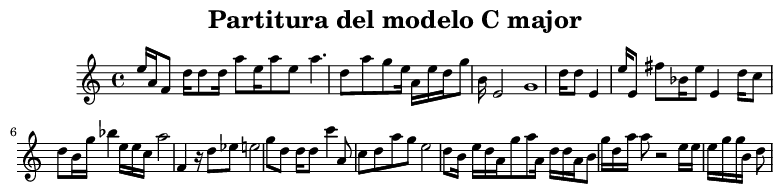

In [ ]:
graficarPartitura(notas,"Partitura del modelo")

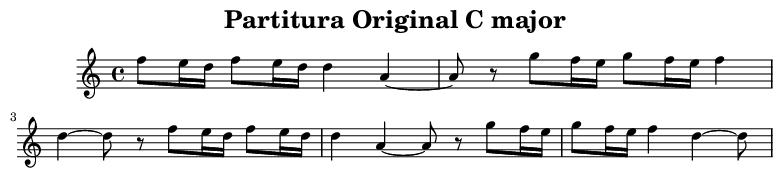

In [ ]:
graficarPartitura(notas2,"Partitura Original")

In [ ]:
from random import choice
from music21 import *
notasmidi=[72,73,74,75,76]

score = stream.Score()
verse = stream.Part()
measure = stream.Measure()

score.insert(0, metadata.Metadata())
score.metadata.composer = 'Aland Bravo Vecorena'
song_key = key.Key('C')
measure.insert(0, song_key)
song_key.octave = 4 # moverse hasta la 4ta octava alrededor del C central
score.metadata.title = "Tonalidad en la armadura de la clave de %s" % song_key.name

print("Composición en la clave de %s" % song_key.name)
print("Notas en la escala de %s" % song_key.name)
# for n in song_key.pitches:
# 	print("%s" % n.name)
# 	copia = note.Note(n.name)
# 	copia.lyric = copia.name
# 	measure.append(copia)
acumulador=0
for n in notas2:
  # copia = note.Note(int(n[0]),quarterLength=float(n[1]))
  # measure.append(copia)
	# print("%s" % n)
  if n[2]=='None':
    if n[0]=="r":
      copia = note.Rest(quarterLength=float(n[1]))
    else:
      copia = note.Note(int(n[0]),quarterLength=float(n[1]))
  elif n[2]=='start':
    copia = note.Note(int(n[0]),quarterLength=float(n[1]))
    copia.tie = tie.Tie('start')
  elif n[2]=='stop':  
    if n[0]=="r":
      copia = note.Rest(quarterLength=float(n[1]))
    else: 
      copia = note.Note(int(n[0]),quarterLength=float(n[1]))
      copia.tie = tie.Tie('stop')

  measure.append(copia)
 
	
 
verse.append(measure)
score.append(verse)
#score.show()
play(score)
show(score)

In [ ]:
from torchsummary import summary

# need device to instantiate model
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

# instantiate model for 8 emotions and move to GPU 
model=TmusicTrasforms(tgt_vocabulario=tgt_vocabulario)
model=model.to(device)

# include input feature map dims in call to summary()
summary(model,[(1,40,1723),(50,)])


In [ ]:
# import torch
inputt = torch.randn(1,1, 40,1723, requires_grad=True)
partitura = torch.randint( 0,132, (2,100))
pato = torch.randn(1,40,430, requires_grad=True)
lenParitura = torch.randint( 30,50, (2,))
prueba = torch.randn(100,2,512, requires_grad=True)
print(inputt.shape)
print(partitura.shape)
print(lenParitura)
print(prueba.shape[0])

In [ ]:
print(pato.shape)
salida=torch.cat((pato,pato,pato))
print(salida.shape)

In [ ]:
pruebaconv2=nn.Conv2d(
            in_channels=1, # input volume depth == input channel dim == 1
            out_channels=2, # expand output feature map volume's depth to 16
            kernel_size=3, # typical 3*3 stride 1 kernel
            stride=1,
            padding=1,
            
                  )

In [ ]:
ress= pruebaconv2(inputt)
ress.shape

In [ ]:
reducir = nn.MaxPool2d(kernel_size=[2,1], stride=[2,1])
salida=reducir(inputt)
salida.shape

In [ ]:
cambiarReshampe = torch.randn(1,10, 4,430, requires_grad=True)
cambiarReshampe.shape

In [ ]:
cambiarReshampe = cambiarReshampe.reshape(cambiarReshampe.shape[0],-1,cambiarReshampe.shape[-1])
cambiarReshampe.shape

In [ ]:
cambiarReshampe = cambiarReshampe.permute(1,2,0) 
cambiarReshampe.shape

In [ ]:
model=TmusicTrasforms(tgt_vocabulario=233)
DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

model=model.to(DEVICE)
for p in model.parameters():
    if p.dim() > 1:
        nn.init.xavier_uniform_(p)

In [ ]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001, betas=(0.9, 0.98), eps=1e-9)
criterion = nn.CTCLoss()

In [ ]:
train_step=make_train_step(model,criterion,optimizer)
loss=train_step(inputt,partitura,lenParitura)
loss

In [ ]:
model.train()
ouput=model(inputt,partitura)
ouput

In [ ]:
alto=torch.max(pato)
alto

In [ ]:
emnb =nn.Embedding(133,512)

salida=emnb(partitura.long())
salida.shape

In [ ]:
pato[0]

In [ ]:
pato.shape

In [ ]:
x = pato.unsqueeze(2)
print(x.size())

x=x.expand([2,5544,512])
print(x.size())

In [ ]:
x[0]

In [ ]:
ys = torch.ones(1, 1).fill_(1).type(torch.long)
ys.shape

In [ ]:
ys = torch.cat([ys,torch.ones(1, 1).type_as().fill_(45)], dim=0)

In [ ]:
log_probs = torch.randn(1,40, 233).softmax(2).detach().requires_grad_()
log_probs = log_probs.reshape(-1, 233)
print(log_probs.shape)#salida del modelo
targets = torch.randint(0, 233, (40,), dtype=torch.long)
#targets = F.one_hot(targets, num_classes=233)
print(targets.shape)#tokens del las partituras
input_lengths = torch.full((1,), 40, dtype=torch.long)
print(input_lengths)#salida de 100 caracteristicas salida decoder
target_lengths = torch.full((1,), 40, dtype=torch.long)
print(target_lengths)#tamanio de las partituras

In [ ]:
log_probs

In [ ]:
targets.shape

In [ ]:
import torch.nn.functional as F  
criterion =nn.CrossEntropyLoss()
loss=criterion(log_probs, targets)
loss